# Image Augmentation

I'm relying heavily on the `imgaug` library.  Installation instructions [here](https://imgaug.readthedocs.io/en/latest/source/installation.html).  Implementations are all in `utils.py`.  You can dig through that if you want, but the demonstrated use cases are all in this notebook.

In [200]:
import imgaug as ia
import imgaug.augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
import cv2
import utils
import xml.etree.ElementTree as ET
import os
from tqdm import tqdm
from importlib import reload

In [230]:
reload(utils)

<module 'utils' from '/home/david/w251-project/utils.py'>

In [86]:
IMAGE = 'TrainData/images/strawimage1.jpg'
ANNOTATION = 'TrainData/annotations/strawimage1.xml'

## Original Image

The image is actually pretty high resolution so it may take a second to plot.

Ripe RGB: (0, 0, 255), Unripe RGB: (0, 255, 0)


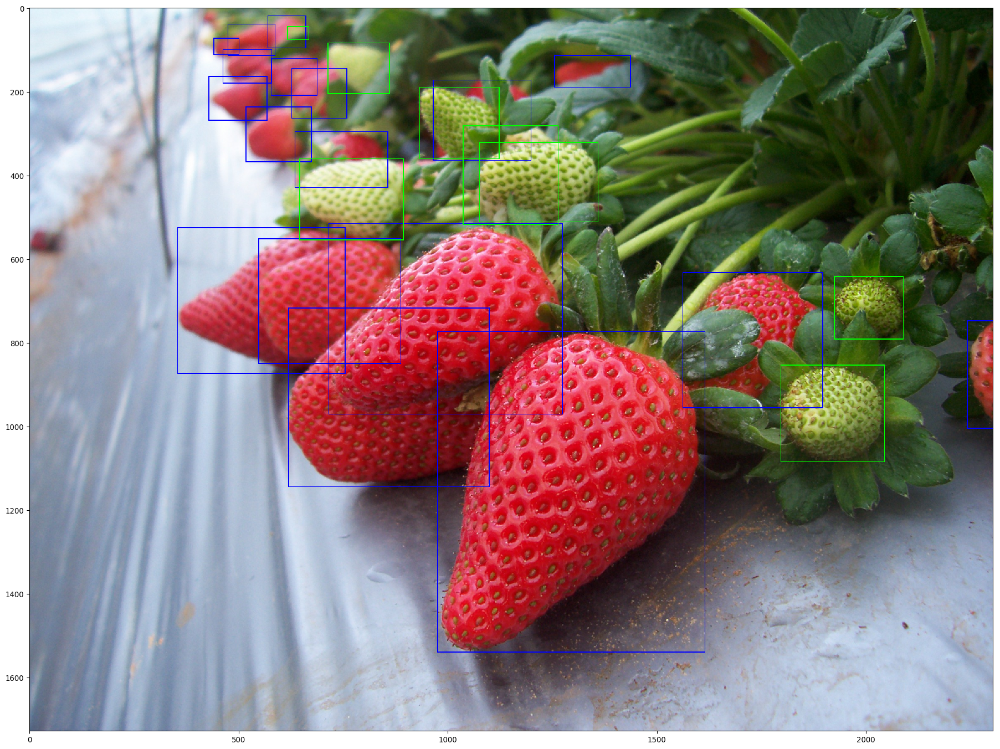

In [188]:
utils.show_annotated_image(image_path=IMAGE, annotation_path=ANNOTATION, ripe_color=utils.BLUE, unripe_color=utils.GREEN)

## Augmented Image

Augmentations are applied randomly.  Rerun the below two cells to see the differences.  I'm a little too lazy to implement plotting several results on a grid, but maybe I'll come back to that if I have time later and it helps for the presentation.

In [180]:
img = utils.read_image(IMAGE)
img_boxes = BoundingBoxesOnImage(utils.get_bounding_boxes(ANNOTATION), shape=img.shape)
img_aug, img_boxes_aug = utils.augment(img, img_boxes)

Ripe RGB: (0, 0, 255), Unripe RGB: (0, 255, 0)


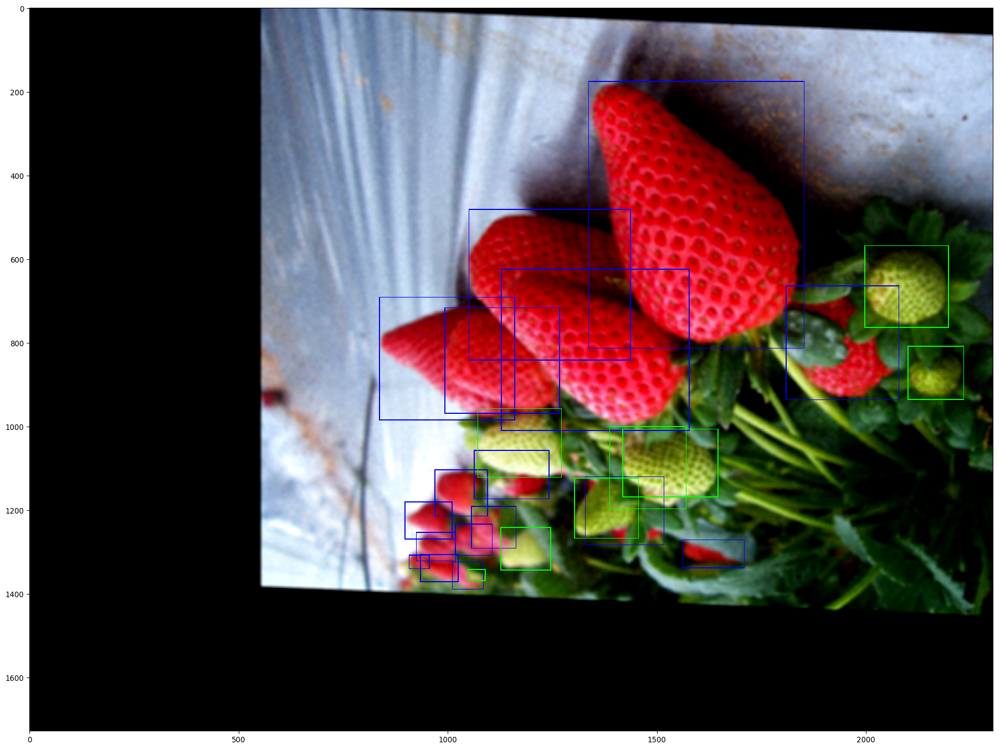

In [181]:
utils.show_annotated_image(image=img_aug, boxes=img_boxes_aug)

## Fancy Augment
Stealing the fancy pipeline from [here](https://imgaug.readthedocs.io/en/latest/source/examples_basics.html#heavy-augmentations).

In [183]:
img_aug, img_boxes_aug = utils.fancy_augment(img, img_boxes)

Ripe RGB: (0, 0, 255), Unripe RGB: (0, 255, 0)


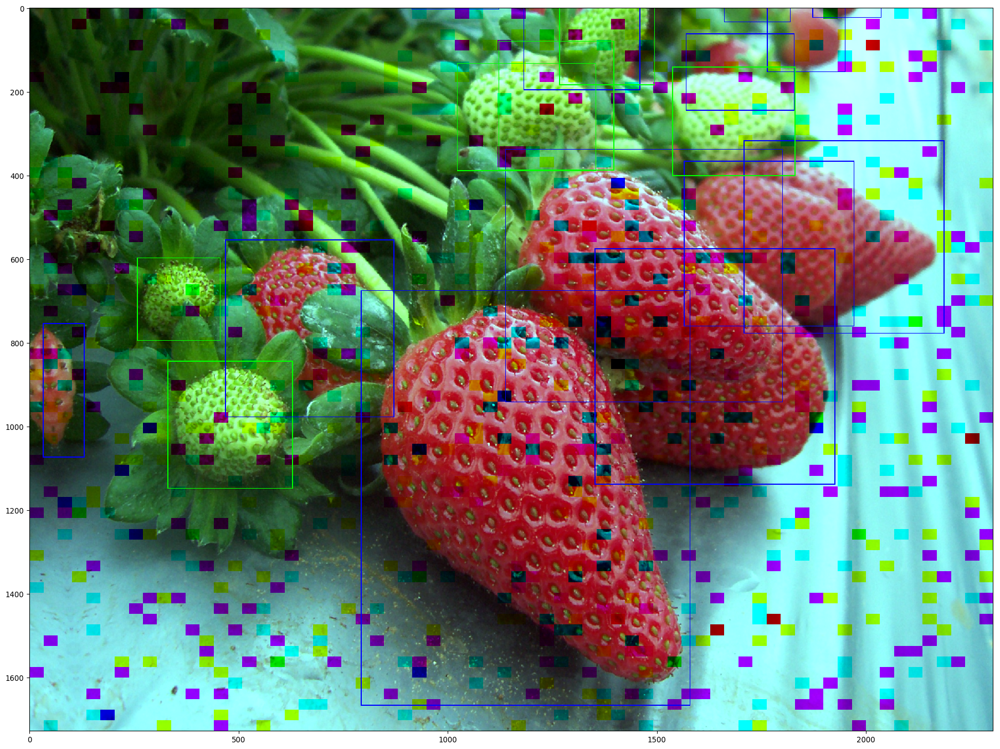

In [184]:
utils.show_annotated_image(image=img_aug, boxes=img_boxes_aug)

## Write the Results

In [202]:
TRAIN_PATH = 'TrainData/images/'
TRAIN_AUGMENTED_PATH = 'TrainData/images_augmented/'
ANNOTATIONS_PATH = 'TrainData/annotations/'
ANNOTATIONS_AUGMENTED_PATH = 'TrainData/annotations_augmented/'
TEST_PATH = 'TestData/images/'

In [251]:
out = []
for f in tqdm(os.listdir(TRAIN_PATH)):
    if f[-4:] != '.jpg':
        continue
    img = utils.read_image(TRAIN_PATH + f)
    img_boxes = BoundingBoxesOnImage(
        utils.get_bounding_boxes(ANNOTATIONS_PATH + f[:-4] + '.xml'), 
        shape=img.shape
    )
    img_aug, img_boxes_aug = utils.augment(img, img_boxes)
    utils.write_image(TRAIN_AUGMENTED_PATH + f, img_aug)
    out += utils.get_training_annotations(TRAIN_AUGMENTED_PATH + f, img_boxes_aug)
    utils.write_annotation_xml('images_augmented', ANNOTATIONS_AUGMENTED_PATH, f, img_aug, img_boxes_aug)

with open('annotate_augmented.txt', 'w') as f:
    f.write('\n'.join(out))

100%|██████████| 179/179 [00:45<00:00,  4.93it/s]


Ripe RGB: (0, 0, 255), Unripe RGB: (0, 255, 0)


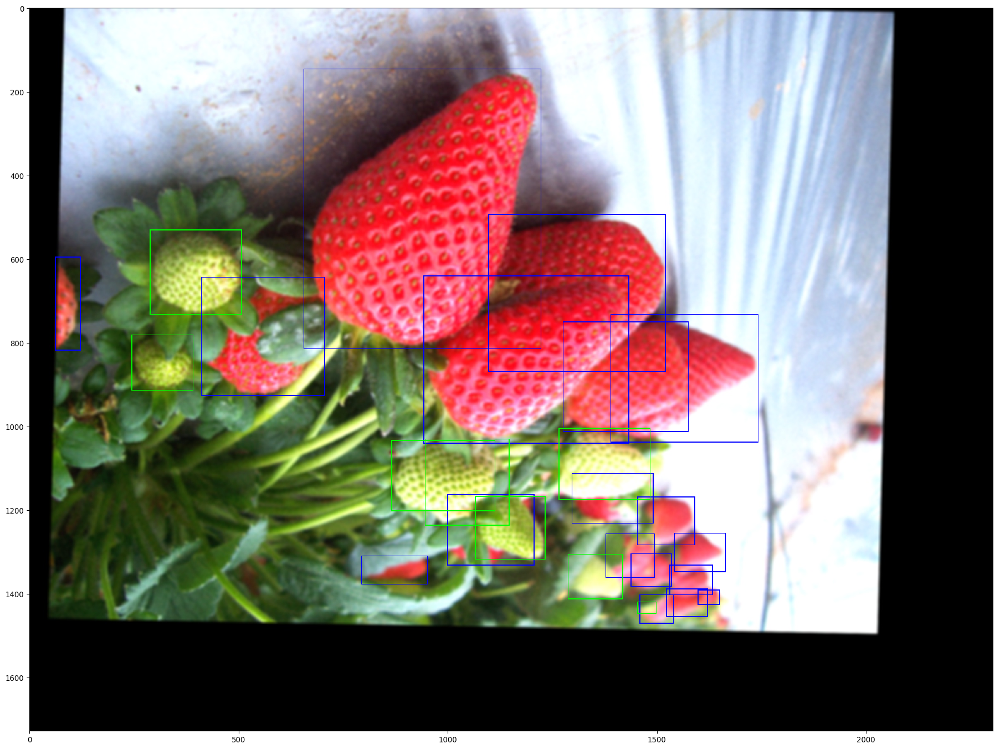

In [252]:
utils.show_annotated_image(image_path='TrainData/images_augmented/strawimage1.jpg', annotation_path='TrainData/annotations_augmented/strawimage1.xml')